In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))


# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/gtzan-dataset-music-genre-classification/Data/features_3_sec.csv
/kaggle/input/gtzan-dataset-music-genre-classification/Data/features_30_sec.csv
/kaggle/input/gtzan-dataset-music-genre-classification/Data/images_original/disco/disco00005.png
/kaggle/input/gtzan-dataset-music-genre-classification/Data/images_original/disco/disco00057.png
/kaggle/input/gtzan-dataset-music-genre-classification/Data/images_original/disco/disco00020.png
/kaggle/input/gtzan-dataset-music-genre-classification/Data/images_original/disco/disco00072.png
/kaggle/input/gtzan-dataset-music-genre-classification/Data/images_original/disco/disco00040.png
/kaggle/input/gtzan-dataset-music-genre-classification/Data/images_original/disco/disco00043.png
/kaggle/input/gtzan-dataset-music-genre-classification/Data/images_original/disco/disco00010.png
/kaggle/input/gtzan-dataset-music-genre-classification/Data/images_original/disco/disco00071.png
/kaggle/input/gtzan-dataset-music-genre-classification/Data/image

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [5]:
import warnings
warnings.filterwarnings("ignore")



# Loading the metadata (features and tracks)

Features contains the various aspects of audio signals and Tracks contain information about genre songs albums etc

In [6]:
tracks = pd.read_csv('/kaggle/input/fma-free-music-archive-small-medium/fma_metadata/tracks.csv')
features= pd.read_csv('/kaggle/input/fma-free-music-archive-small-medium/fma_metadata/features.csv')


# Understanding the structure and content of data

In [7]:
tracks.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 106576 entries, 0 to 106575
Data columns (total 53 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   Unnamed: 0  106575 non-null  object
 1   album       106575 non-null  object
 2   album.1     103046 non-null  object
 3   album.2     70295 non-null   object
 4   album.3     15296 non-null   object
 5   album.4     106575 non-null  object
 6   album.5     106575 non-null  object
 7   album.6     83150 non-null   object
 8   album.7     106575 non-null  object
 9   album.8     18061 non-null   object
 10  album.9     106575 non-null  object
 11  album.10    105550 non-null  object
 12  album.11    106575 non-null  object
 13  album.12    100067 non-null  object
 14  artist      22712 non-null   object
 15  artist.1    5376 non-null    object
 16  artist.2    14272 non-null   object
 17  artist.3    71157 non-null   object
 18  artist.4    106575 non-null  object
 19  artist.5    105719 non-

In [8]:
features.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 106577 entries, 0 to 106576
Columns: 519 entries, feature to zcr.6
dtypes: object(519)
memory usage: 422.0+ MB


**Summary statistics**

In [9]:
tracks.describe()


,Unnamed: 0,album,album.1,album.2,album.3,album.4,album.5,album.6,album.7,album.8,...,track.10,track.11,track.12,track.13,track.14,track.15,track.16,track.17,track.18,track.19
count,106575,106575,103046,70295,15296,106575,106575,83150,106575,18061,...,2350,106575,15025,106488,106575,312,106575,1264,106575,106574
unique,106575,29,14341,3670,623,65,14929,11076,11351,761,...,1587,18977,45,114,15340,67,331,136,2452,94987
top,track_id,0,2015-01-26 13:04:57,2008-01-01 00:00:00,Ernie Indradat,0,-1,"<p class=""p1"" style=""margin: 0px; padding: 8px...",-1,Joe Belock,...,"<p><a href=""http://www.myspace.com/theshambler...",320,en,Attribution-Noncommercial-Share Alike 3.0 Unit...,97,Apache Tomcat,1,Victrola Dog (ASCAP),[],Untitled
freq,1,71187,310,667,876,45753,805,310,3130,855,...,22,67,14255,19250,110,44,10459,465,83078,298


In [10]:
features.describe()

,feature,chroma_cens,chroma_cens.1,chroma_cens.2,chroma_cens.3,chroma_cens.4,chroma_cens.5,chroma_cens.6,chroma_cens.7,chroma_cens.8,...,tonnetz.39,tonnetz.40,tonnetz.41,zcr,zcr.1,zcr.2,zcr.3,zcr.4,zcr.5,zcr.6
count,106577,106576.000000,106576.0000,106576.000000,106576.000000,106576.000000,106576.000000,106576.000000,106576.000000,106576.00000,...,106576.000000,106576.000000,106576.000000,106576.000000,106576.000000,106576.000000,106576.000000,106576.0,106576.000000,106576.000000
unique,106577,104376.000000,104381.0000,104389.000000,104394.000000,104409.000000,104378.000000,104389.000000,104383.000000,104374.00000,...,104170.000000,103962.000000,103954.000000,104379.000000,2583.000000,104218.000000,1153.000000,214.0,104320.000000,104272.000000
top,statistics,2.120035,-0.1481,0.687363,1.388522,-0.779828,-1.049356,-1.352663,-1.146229,0.13384,...,0.115733,0.023668,0.022414,101.444832,0.397949,0.040447,0.024414,0.0,5.669625,0.026036
freq,1,90.000000,90.0000,90.000000,90.000000,90.000000,90.000000,90.000000,90.000000,90.00000,...,90.000000,90.000000,90.000000,90.000000,156.000000,90.000000,1105.000000,53740.0,90.000000,90.000000


In [11]:
tracks.isnull().sum()

Unnamed: 0         1
album              1
album.1         3530
album.2        36281
album.3        91280
album.4            1
album.5            1
album.6        23426
album.7            1
album.8        88515
album.9            1
album.10        1026
album.11           1
album.12        6509
artist         83864
artist.1      101200
artist.2       92304
artist.3       35419
artist.4           1
artist.5         857
artist.6           1
artist.7           1
artist.8       62031
artist.9       36365
artist.10      62031
artist.11      59726
artist.12          1
artist.13      93423
artist.14          1
artist.15      27319
artist.16     100994
set                1
set.1              1
track              1
track.1            1
track.2       102905
track.3            1
track.4       100416
track.5            1
track.6            1
track.7        56977
track.8            1
track.9            1
track.10      104226
track.11           1
track.12       91551
track.13          88
track.14     

In [12]:
features.isnull().sum()

feature          0
chroma_cens      1
chroma_cens.1    1
chroma_cens.2    1
chroma_cens.3    1
                ..
zcr.2            1
zcr.3            1
zcr.4            1
zcr.5            1
zcr.6            1
Length: 519, dtype: int64

# Data Cleaning

**For tracks DataFrame**:
1. Drop Columns: Drop columns with a high percentage of missing values if not crucial for analysis.
2. Imputation: For numerical columns, imputing missing values with mean, median, or mode. For categorical columns, imputing missing values with the most frequent category.
3. Text Data: For text data, filling missing values with a placeholder or dropping the rows/columns if it's not significant.
**For features DataFrame**:
1. Drop Rows: Since the features DataFrame has a large number of columns, dropping rows with missing values is  a more suitable approach.
2. Imputation: For numerical features, imputing missing values using mean, median, or mode.**

Drop columns with high percentage of missing values in tracks DataFrame

In [13]:
tracks = tracks.dropna(thresh=len(tracks) * 0.7, axis=1)

Impute missing values in remaining columns
1. For object dtype columns, fill missing values with the most frequent category
2. For numerical dtype columns, fill missing values with mean

Since, columns contains both numerical and categorical data each case handled seperately

In [14]:
from scipy.stats import mode
def handle_missing_values(df):
    for column in df.columns:
        if df[column].dtype == 'object':
            df[column] = df[column].fillna(df[column].mode()[0])
        else:
            df[column] = df[column].fillna(df[column].mean())


In [15]:
handle_missing_values(tracks)

In [16]:
handle_missing_values(features)

In [17]:
features = features.dropna()

In [18]:
for column in features.columns:
    if features[column].dtype == 'object':
        features[column] = features[column].fillna(features[column].mode()[0])
    else:
        features[column] = features[column].fillna(features[column].mean())

In [19]:
tracks.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 106576 entries, 0 to 106575
Data columns (total 33 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   Unnamed: 0  106576 non-null  object
 1   album       106576 non-null  object
 2   album.1     106576 non-null  object
 3   album.4     106576 non-null  object
 4   album.5     106576 non-null  object
 5   album.6     106576 non-null  object
 6   album.7     106576 non-null  object
 7   album.9     106576 non-null  object
 8   album.10    106576 non-null  object
 9   album.11    106576 non-null  object
 10  album.12    106576 non-null  object
 11  artist.4    106576 non-null  object
 12  artist.5    106576 non-null  object
 13  artist.6    106576 non-null  object
 14  artist.7    106576 non-null  object
 15  artist.12   106576 non-null  object
 16  artist.14   106576 non-null  object
 17  artist.15   106576 non-null  object
 18  set         106576 non-null  object
 19  set.1       106576 non-

Missing Values handled

In [20]:
features.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 106577 entries, 0 to 106576
Columns: 519 entries, feature to zcr.6
dtypes: object(519)
memory usage: 422.0+ MB


In [21]:
features.isnull().sum()

feature          0
chroma_cens      0
chroma_cens.1    0
chroma_cens.2    0
chroma_cens.3    0
                ..
zcr.2            0
zcr.3            0
zcr.4            0
zcr.5            0
zcr.6            0
Length: 519, dtype: int64

In [22]:
tracks.isnull().sum()

Unnamed: 0    0
album         0
album.1       0
album.4       0
album.5       0
album.6       0
album.7       0
album.9       0
album.10      0
album.11      0
album.12      0
artist.4      0
artist.5      0
artist.6      0
artist.7      0
artist.12     0
artist.14     0
artist.15     0
set           0
set.1         0
track         0
track.1       0
track.3       0
track.5       0
track.6       0
track.8       0
track.9       0
track.11      0
track.13      0
track.14      0
track.16      0
track.18      0
track.19      0
dtype: int64

All missing values handled

# Restructuring the data

In [23]:
tracks_columns = tracks.columns.tolist()
print("Columns in Tracks DataFrame:")
print(tracks_columns)
print()


Columns in Tracks DataFrame:
['Unnamed: 0', 'album', 'album.1', 'album.4', 'album.5', 'album.6', 'album.7', 'album.9', 'album.10', 'album.11', 'album.12', 'artist.4', 'artist.5', 'artist.6', 'artist.7', 'artist.12', 'artist.14', 'artist.15', 'set', 'set.1', 'track', 'track.1', 'track.3', 'track.5', 'track.6', 'track.8', 'track.9', 'track.11', 'track.13', 'track.14', 'track.16', 'track.18', 'track.19']



In [24]:
features.head()

,feature,chroma_cens,chroma_cens.1,chroma_cens.2,chroma_cens.3,chroma_cens.4,chroma_cens.5,chroma_cens.6,chroma_cens.7,chroma_cens.8,...,tonnetz.39,tonnetz.40,tonnetz.41,zcr,zcr.1,zcr.2,zcr.3,zcr.4,zcr.5,zcr.6
0,statistics,kurtosis,kurtosis,kurtosis,kurtosis,kurtosis,kurtosis,kurtosis,kurtosis,kurtosis,...,std,std,std,kurtosis,max,mean,median,min,skew,std
1,number,01,02,03,04,05,06,07,08,09,...,04,05,06,01,01,01,01,01,01,01
2,track_id,2.120035,-0.1481,0.687363,1.388522,-0.779828,-1.049356,-1.352663,-1.146229,0.13384,...,0.115733,0.023668,0.022414,101.444832,0.397949,0.040447,0.024414,0.0,5.669625,0.026036
3,2,7.1806526184e+00,5.2303090096e+00,2.4932080507e-01,1.3476201296e+00,1.4824777842e+00,5.3137123585e-01,1.4815930128e+00,2.6914546490e+00,8.6686819792e-01,...,5.4125156254e-02,1.2225749902e-02,1.2110591866e-02,5.7588901520e+00,4.5947265625e-01,8.5629448295e-02,7.1289062500e-02,0.0000000000e+00,2.0898721218e+00,6.1448108405e-02
4,3,1.8889633417e+00,7.6053929329e-01,3.4529656172e-01,2.2952005863e+00,1.6540306807e+00,6.7592434585e-02,1.3668476343e+00,1.0540937185e+00,1.0810308903e-01,...,6.3831120729e-02,1.4211839065e-02,1.7740072682e-02,2.8246941566e+00,4.6630859375e-01,8.4578499198e-02,6.3964843750e-02,0.0000000000e+00,1.7167237997e+00,6.9330163300e-02


In [25]:
tracks.head()

,Unnamed: 0,album,album.1,album.4,album.5,album.6,album.7,album.9,album.10,album.11,...,track.5,track.6,track.8,track.9,track.11,track.13,track.14,track.16,track.18,track.19
0,track_id,comments,date_created,favorites,id,information,listens,tags,title,tracks,...,duration,favorites,genres,genres_all,interest,license,listens,number,tags,title
1,track_id,0,2015-01-26 13:04:57,0,-1,"<p class=""p1"" style=""margin: 0px; padding: 8px...",-1,[],microSong Entries,10,...,180,0,[21],[21],320,Attribution-Noncommercial-Share Alike 3.0 Unit...,97,1,[],Untitled
2,2,0,2008-11-26 01:44:45,4,1,<p></p>,6073,[],AWOL - A Way Of Life,7,...,168,2,[21],[21],4656,Attribution-NonCommercial-ShareAlike 3.0 Inter...,1293,3,[],Food
3,3,0,2008-11-26 01:44:45,4,1,<p></p>,6073,[],AWOL - A Way Of Life,7,...,237,1,[21],[21],1470,Attribution-NonCommercial-ShareAlike 3.0 Inter...,514,4,[],Electric Ave
4,5,0,2008-11-26 01:44:45,4,1,<p></p>,6073,[],AWOL - A Way Of Life,7,...,206,6,[21],[21],1933,Attribution-NonCommercial-ShareAlike 3.0 Inter...,1151,6,[],This World


In [26]:
def rename_fma_features(features):
    df_features_name = features.iloc[:2, 1:]
    new_feature_name = ['track_id']
    for i in range(len(df_features_name.columns)):
        feat = df_features_name.iloc[:, i]
        feat_name = feat.name.split('.')[0]
        stat = feat[0]
        num = feat[1]
        name = feat_name + '_' + num + '_' + stat
        new_feature_name.append(name)
    return_df = features.iloc[3:, :].reset_index(drop=True)
    return_df.columns = new_feature_name
    return return_df


In [27]:
raw_features = pd.read_csv('/kaggle/input/fma-free-music-archive-small-medium/fma_metadata/features.csv', low_memory=False)
features1 = rename_fma_features(raw_features)
features1 = features1.apply(pd.to_numeric)


In [28]:
features=features1
features

,track_id,chroma_cens_01_kurtosis,chroma_cens_02_kurtosis,chroma_cens_03_kurtosis,chroma_cens_04_kurtosis,chroma_cens_05_kurtosis,chroma_cens_06_kurtosis,chroma_cens_07_kurtosis,chroma_cens_08_kurtosis,chroma_cens_09_kurtosis,...,tonnetz_04_std,tonnetz_05_std,tonnetz_06_std,zcr_01_kurtosis,zcr_01_max,zcr_01_mean,zcr_01_median,zcr_01_min,zcr_01_skew,zcr_01_std
0,2,7.180653,5.230309,0.249321,1.347620,1.482478,0.531371,1.481593,2.691455,0.866868,...,0.054125,0.012226,0.012111,5.758890,0.459473,0.085629,0.071289,0.000000,2.089872,0.061448
1,3,1.888963,0.760539,0.345297,2.295201,1.654031,0.067592,1.366848,1.054094,0.108103,...,0.063831,0.014212,0.017740,2.824694,0.466309,0.084578,0.063965,0.000000,1.716724,0.069330
2,5,0.527563,-0.077654,-0.279610,0.685883,1.937570,0.880839,-0.923192,-0.927232,0.666617,...,0.040730,0.012691,0.014759,6.808415,0.375000,0.053114,0.041504,0.000000,2.193303,0.044861
3,10,3.702245,-0.291193,2.196742,-0.234449,1.367364,0.998411,1.770694,1.604566,0.521217,...,0.074358,0.017952,0.013921,21.434212,0.452148,0.077515,0.071777,0.000000,3.542325,0.040800
4,20,-0.193837,-0.198527,0.201546,0.258556,0.775204,0.084794,-0.289294,-0.816410,0.043851,...,0.095003,0.022492,0.021355,16.669037,0.469727,0.047225,0.040039,0.000977,3.189831,0.030993
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106569,155316,-0.490129,0.463834,2.321970,-0.084352,1.662914,2.115189,-0.237794,5.695442,0.830353,...,0.128410,0.022547,0.019816,4.448255,0.172852,0.028773,0.028320,0.003906,0.955388,0.012385
106570,155317,-0.461559,-0.229601,-0.496632,-0.422033,0.130612,-0.263825,-0.628103,-0.082687,-0.229483,...,0.132964,0.023548,0.026527,3.270612,0.196289,0.031116,0.027832,0.002441,1.283060,0.019059
106571,155318,0.552473,-0.110498,-0.532014,0.263131,-0.224011,-0.530972,1.713526,1.418444,1.325197,...,0.108324,0.017540,0.020471,2.356727,0.212891,0.038450,0.037109,0.003418,0.828569,0.017904
106572,155319,-0.176901,0.187208,-0.050664,0.368843,0.066005,-0.857354,-0.780860,0.626281,-0.630938,...,0.088311,0.018328,0.017936,6.188604,0.167480,0.041480,0.038086,0.004883,1.818740,0.020133


Renamed the features

In [29]:
features.isnull().sum()

track_id                   0
chroma_cens_01_kurtosis    0
chroma_cens_02_kurtosis    0
chroma_cens_03_kurtosis    0
chroma_cens_04_kurtosis    0
                          ..
zcr_01_mean                0
zcr_01_median              0
zcr_01_min                 0
zcr_01_skew                0
zcr_01_std                 0
Length: 519, dtype: int64

In [30]:
tracks2 = pd.read_csv('/kaggle/input/fma-free-music-archive-small-medium/fma_metadata/tracks.csv', index_col=0, low_memory=False)
track_info = tracks2[["track.7",'track.8']]
track_info.columns = track_info.iloc[0].rename('track_id')
track_info = track_info.iloc[2:]
track_info

track_id,genre_top,genres
2,Hip-Hop,[21]
3,Hip-Hop,[21]
5,Hip-Hop,[21]
10,Pop,[10]
20,NaN,"[76, 103]"
...,...,...
155316,Rock,[25]
155317,Rock,[25]
155318,Rock,[25]
155319,Rock,[25]


In [31]:

track_info.genre_top.value_counts()
track_info.genre_top.value_counts().sum()

49598

In [32]:
track_info_wo_genre = track_info.loc[pd.isnull(track_info).any(axis=1)]

genres_df = pd.read_csv('/kaggle/input/fma-free-music-archive-small-medium/fma_metadata/genres.csv')
genre_names = []
for i in track_info_wo_genre.genres:
    j = eval(i)+[0]
    if j[0] != 0:
        top_level = genres_df[genres_df.genre_id==j[0]].top_level.values[0]
        parent_genre = genres_df[genres_df.genre_id==top_level]['title'].values[0]
    else:
        parent_genre = np.nan
    genre_names.append(parent_genre)
track_info_ = track_info.copy()
track_info_.loc[track_info_wo_genre.index, 'genre_top'] = genre_names

In [33]:
track_info_.genre_top.value_counts()

genre_top
Electronic             25046
Experimental           22724
Rock                   21282
Pop                     8015
Folk                    6083
Hip-Hop                 4534
Instrumental            4367
International           2924
Jazz                    2293
Classical               2102
Blues                   1676
Soul-RnB                 920
Spoken                   768
Country                  726
Old-Time / Historic      710
Easy Listening           173
Name: count, dtype: int64

In [34]:
track_info_.genre_top.value_counts().sum()

104343

In [35]:
track_info_.index = pd.to_numeric(track_info_.index)
genres = track_info_[['genre_top']]
data = pd.concat([genres, features.set_index('track_id')], axis=1).dropna()

In [36]:
data

,genre_top,chroma_cens_01_kurtosis,chroma_cens_02_kurtosis,chroma_cens_03_kurtosis,chroma_cens_04_kurtosis,chroma_cens_05_kurtosis,chroma_cens_06_kurtosis,chroma_cens_07_kurtosis,chroma_cens_08_kurtosis,chroma_cens_09_kurtosis,...,tonnetz_04_std,tonnetz_05_std,tonnetz_06_std,zcr_01_kurtosis,zcr_01_max,zcr_01_mean,zcr_01_median,zcr_01_min,zcr_01_skew,zcr_01_std
2,Hip-Hop,7.180653,5.230309,0.249321,1.347620,1.482478,0.531371,1.481593,2.691455,0.866868,...,0.054125,0.012226,0.012111,5.758890,0.459473,0.085629,0.071289,0.000000,2.089872,0.061448
3,Hip-Hop,1.888963,0.760539,0.345297,2.295201,1.654031,0.067592,1.366848,1.054094,0.108103,...,0.063831,0.014212,0.017740,2.824694,0.466309,0.084578,0.063965,0.000000,1.716724,0.069330
5,Hip-Hop,0.527563,-0.077654,-0.279610,0.685883,1.937570,0.880839,-0.923192,-0.927232,0.666617,...,0.040730,0.012691,0.014759,6.808415,0.375000,0.053114,0.041504,0.000000,2.193303,0.044861
10,Pop,3.702245,-0.291193,2.196742,-0.234449,1.367364,0.998411,1.770694,1.604566,0.521217,...,0.074358,0.017952,0.013921,21.434212,0.452148,0.077515,0.071777,0.000000,3.542325,0.040800
20,Pop,-0.193837,-0.198527,0.201546,0.258556,0.775204,0.084794,-0.289294,-0.816410,0.043851,...,0.095003,0.022492,0.021355,16.669037,0.469727,0.047225,0.040039,0.000977,3.189831,0.030993
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
155316,Rock,-0.490129,0.463834,2.321970,-0.084352,1.662914,2.115189,-0.237794,5.695442,0.830353,...,0.128410,0.022547,0.019816,4.448255,0.172852,0.028773,0.028320,0.003906,0.955388,0.012385
155317,Rock,-0.461559,-0.229601,-0.496632,-0.422033,0.130612,-0.263825,-0.628103,-0.082687,-0.229483,...,0.132964,0.023548,0.026527,3.270612,0.196289,0.031116,0.027832,0.002441,1.283060,0.019059
155318,Rock,0.552473,-0.110498,-0.532014,0.263131,-0.224011,-0.530972,1.713526,1.418444,1.325197,...,0.108324,0.017540,0.020471,2.356727,0.212891,0.038450,0.037109,0.003418,0.828569,0.017904
155319,Rock,-0.176901,0.187208,-0.050664,0.368843,0.066005,-0.857354,-0.780860,0.626281,-0.630938,...,0.088311,0.018328,0.017936,6.188604,0.167480,0.041480,0.038086,0.004883,1.818740,0.020133


# Made a single dataframe using features and tracks

# Data Visualisations

In [37]:
data_columns = data.columns.tolist()
data_columns

['genre_top',
 'chroma_cens_01_kurtosis',
 'chroma_cens_02_kurtosis',
 'chroma_cens_03_kurtosis',
 'chroma_cens_04_kurtosis',
 'chroma_cens_05_kurtosis',
 'chroma_cens_06_kurtosis',
 'chroma_cens_07_kurtosis',
 'chroma_cens_08_kurtosis',
 'chroma_cens_09_kurtosis',
 'chroma_cens_10_kurtosis',
 'chroma_cens_11_kurtosis',
 'chroma_cens_12_kurtosis',
 'chroma_cens_01_max',
 'chroma_cens_02_max',
 'chroma_cens_03_max',
 'chroma_cens_04_max',
 'chroma_cens_05_max',
 'chroma_cens_06_max',
 'chroma_cens_07_max',
 'chroma_cens_08_max',
 'chroma_cens_09_max',
 'chroma_cens_10_max',
 'chroma_cens_11_max',
 'chroma_cens_12_max',
 'chroma_cens_01_mean',
 'chroma_cens_02_mean',
 'chroma_cens_03_mean',
 'chroma_cens_04_mean',
 'chroma_cens_05_mean',
 'chroma_cens_06_mean',
 'chroma_cens_07_mean',
 'chroma_cens_08_mean',
 'chroma_cens_09_mean',
 'chroma_cens_10_mean',
 'chroma_cens_11_mean',
 'chroma_cens_12_mean',
 'chroma_cens_01_median',
 'chroma_cens_02_median',
 'chroma_cens_03_median',
 'chroma

**Since the dataset is very big creating subsets with various features for visualisation**

In [38]:
selected_features = [
    'spectral_centroid_01_mean',
    'spectral_bandwidth_01_mean',
    'spectral_contrast_01_mean',
    'spectral_rolloff_01_mean',
    'mfcc_01_mean',
    'mfcc_02_mean',
    'mfcc_03_mean',
    'mfcc_04_mean',
    'mfcc_05_mean',
    'mfcc_06_mean',
]

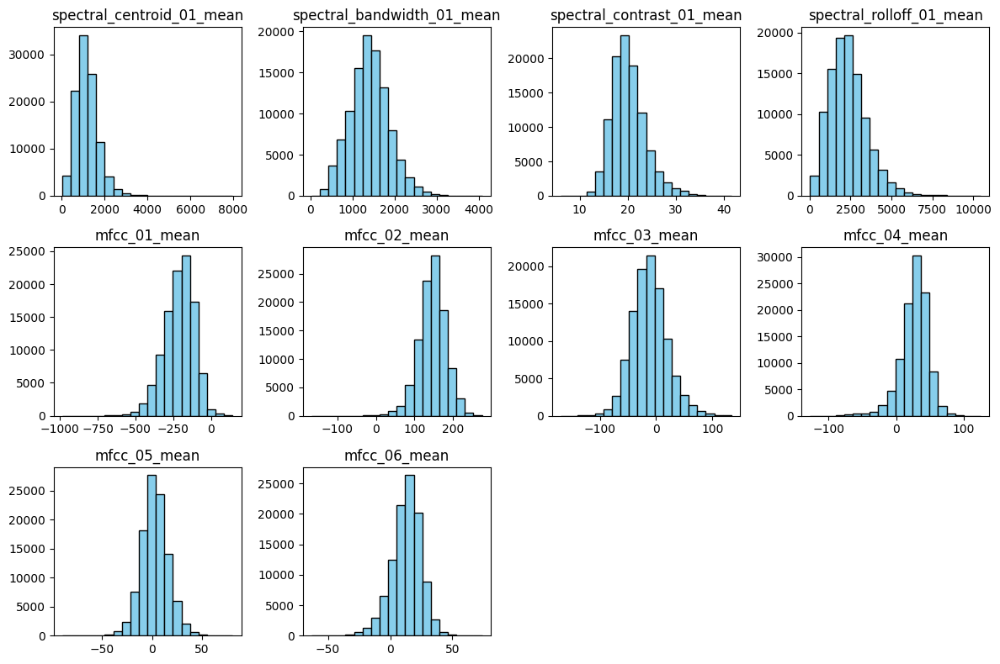

In [39]:
subset_df = data[selected_features]

plt.figure(figsize=(12, 8))
for i, feature in enumerate(selected_features):
    plt.subplot(3, 4, i+1)
    plt.hist(subset_df[feature], bins=20, color='skyblue', edgecolor='black')
    plt.title(feature)

plt.tight_layout()
plt.show()

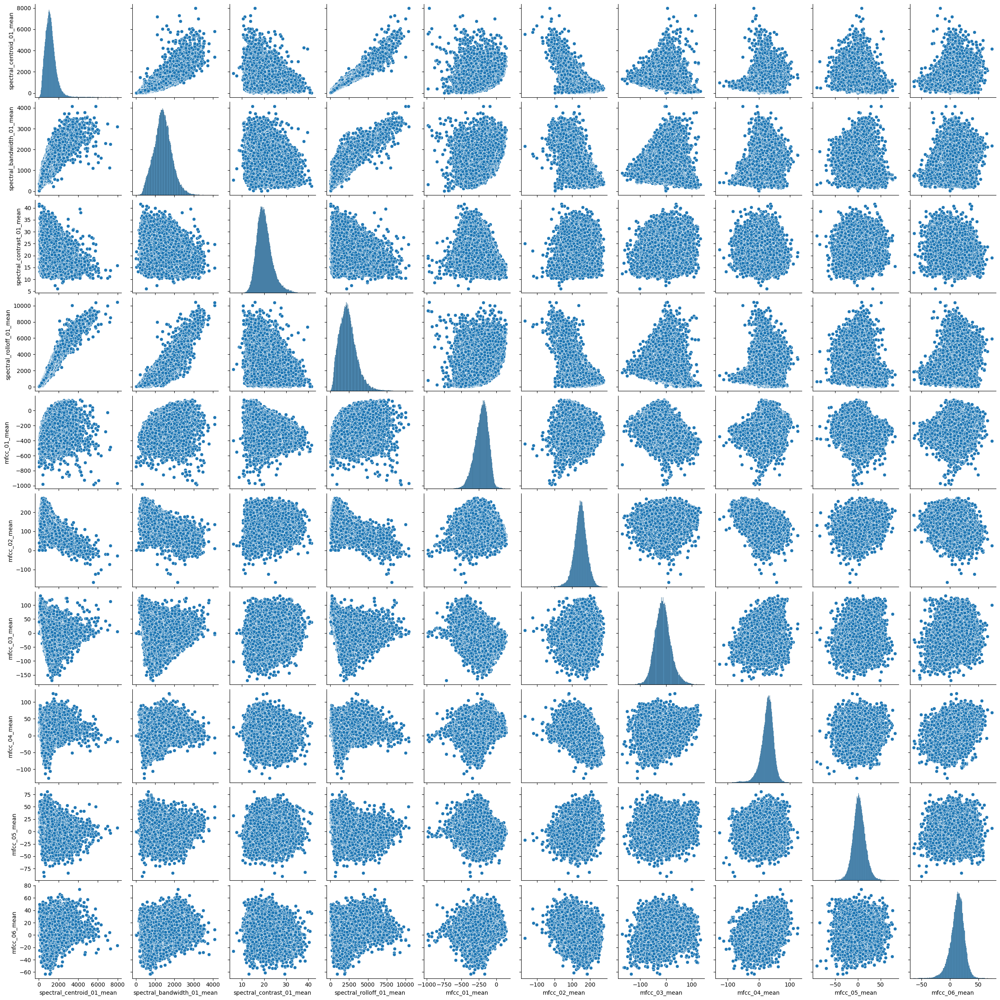

In [40]:
sns.pairplot(subset_df)
plt.show()

**Centroid rolloff bandwidth highly correlated Therefore only one needs to be selected: CENTROID**

In [41]:
selected_features = [
    'chroma_cens_01_mean',
    'chroma_cens_02_mean',
    'chroma_cens_03_mean',
    'chroma_cens_04_mean',
    'chroma_cens_05_mean',
    'genre_top'  
]

In [ ]:
import warnings

warnings.filterwarnings("ignore")

warnings.filterwarnings("ignore", category=DeprecationWarning)


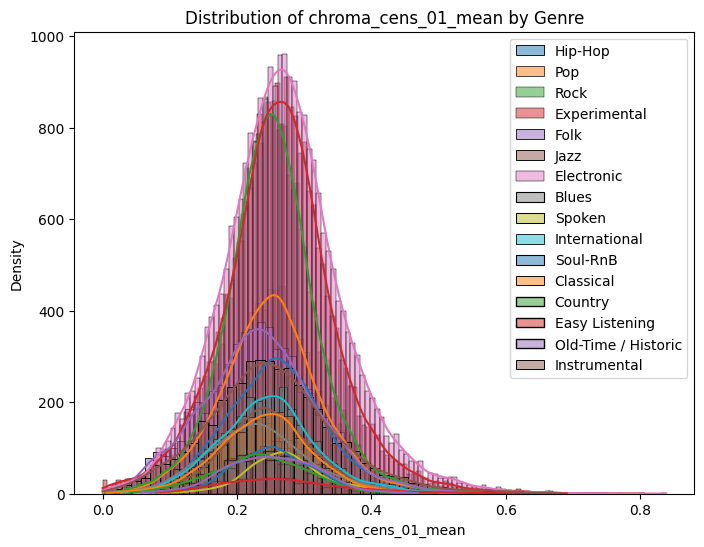

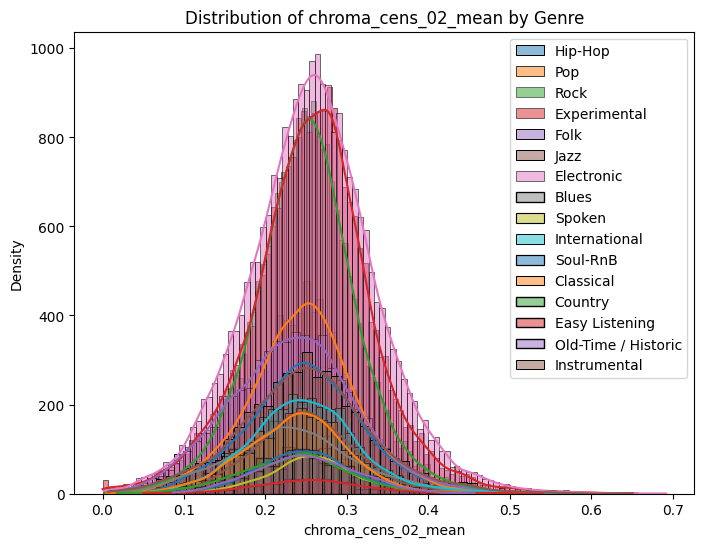

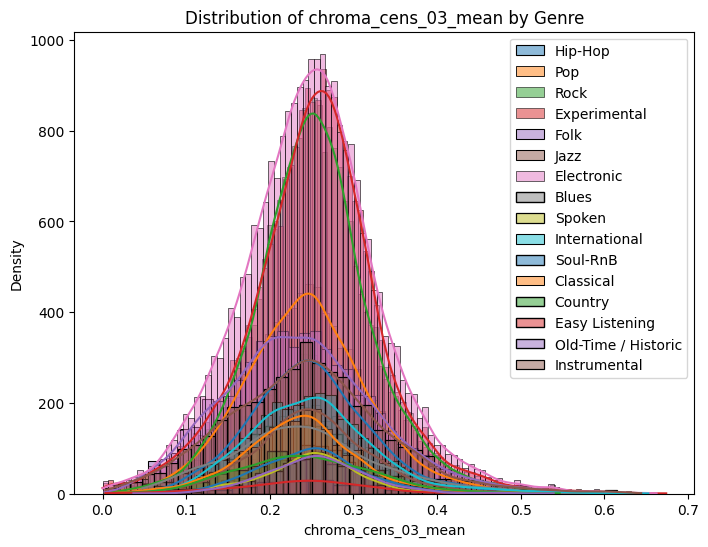

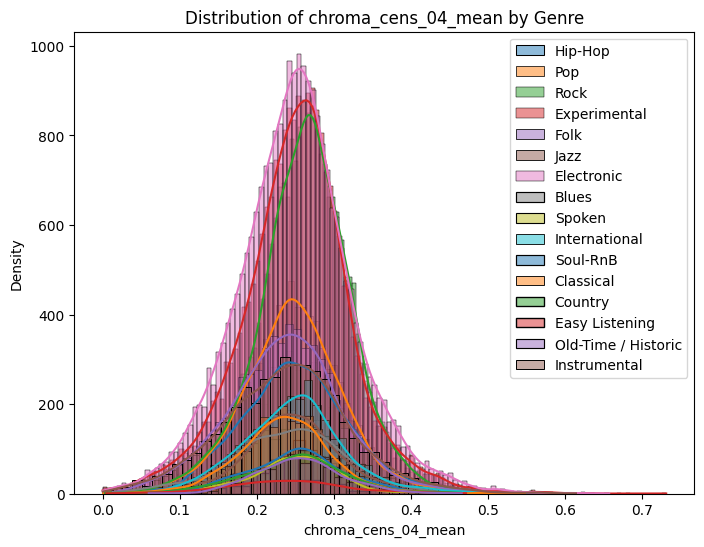

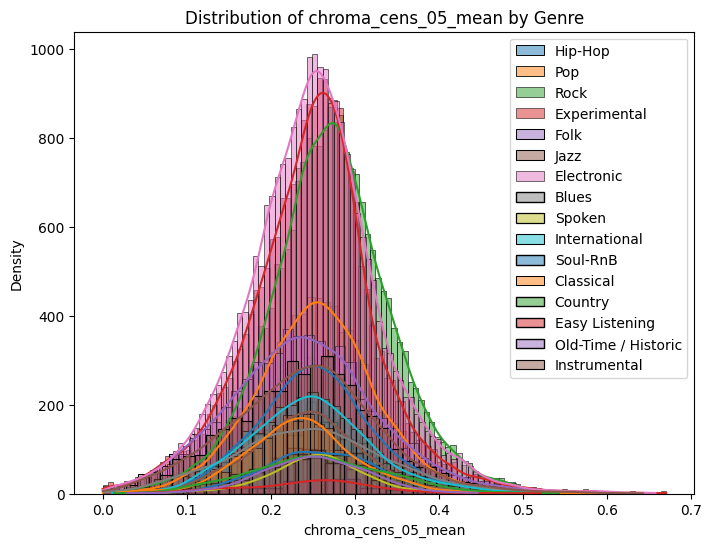

In [42]:
for feature in selected_features[:-1]:
    plt.figure(figsize=(8, 6))
    for genre in data['genre_top'].unique():
        sns.histplot(data[data['genre_top'] == genre][feature], kde=True, label=genre)
    plt.title(f'Distribution of {feature} by Genre')
    plt.xlabel(feature)
    plt.ylabel('Density')
    plt.legend()
    plt.show()



Genres with similar chroma_cens_03_mean distributions: The genres that appear to have similar distributions  include Hip-Hop, Pop, Rock, Experimental, Folk, Jazz, Electronic, and Blues. These genres have density plots that overlap significantly, suggesting that the distribution of chroma_cens_mean values in these genres is similar.

Genres with distinct chroma_cens__mean distributions: The genres that appear to have distinct distributions of chroma_cens__mean include Spoken, International, Soul-RnB, Classical, Country, Easy Listening, Old-Time / Historic, and Instrumental. The density plots for these genres show less overlap with the other genres, suggesting that the distribution of chroma_cens__mean values in these genres is different.

Spoken, International, Soul-RnB, and Old-Time / Historic: These genres have density plots that are shifted to the left side of the graph, which suggests that they tend to have lower values of chroma_cens__mean.
Classical and Easy Listening: These genres have density plots that are shifted to the right side of the graph, which suggests that they tend to have higher values of chroma_cens__mean.

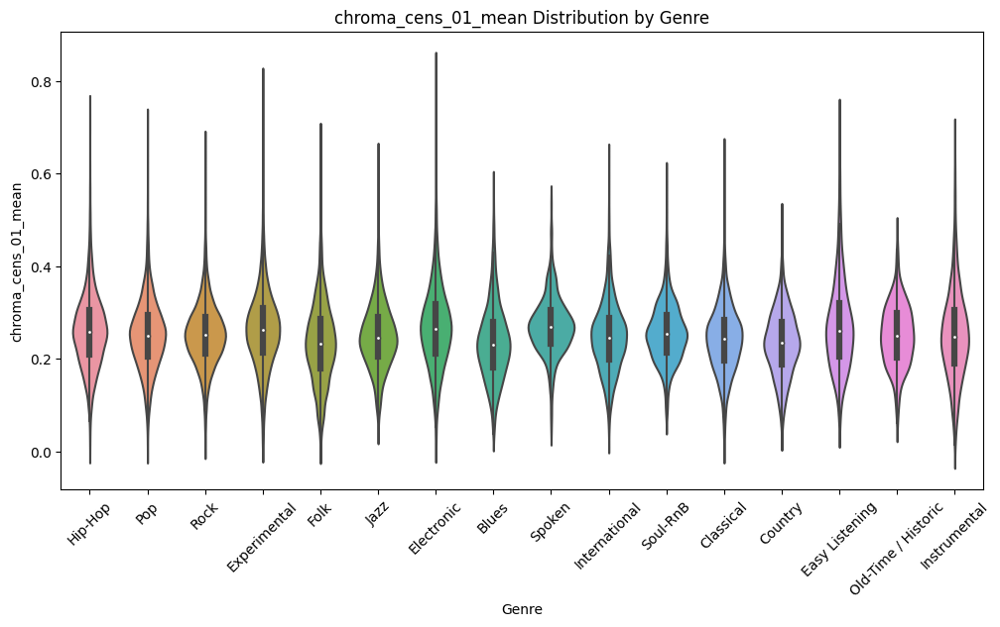

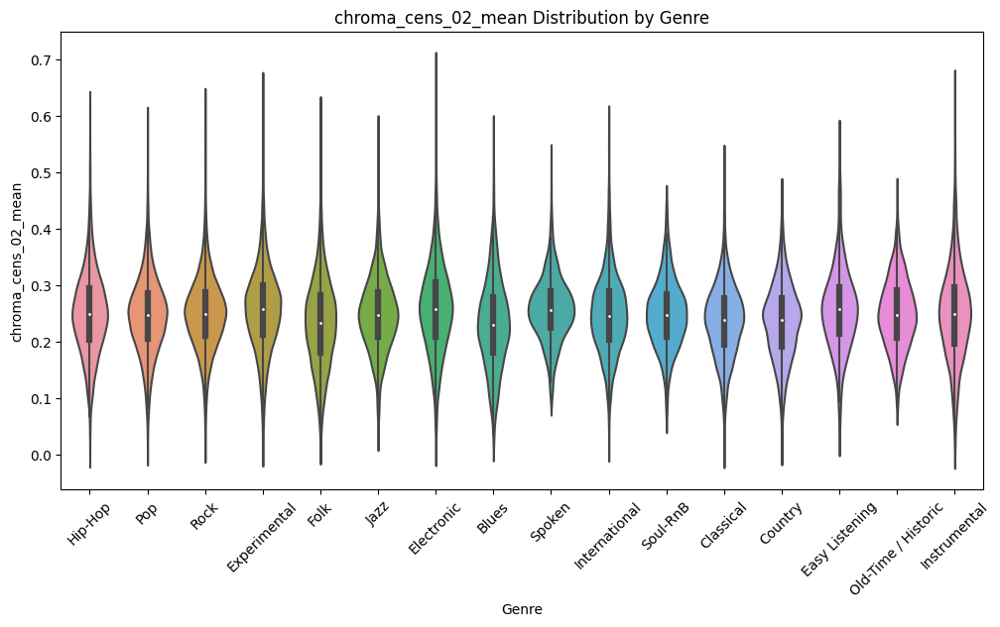

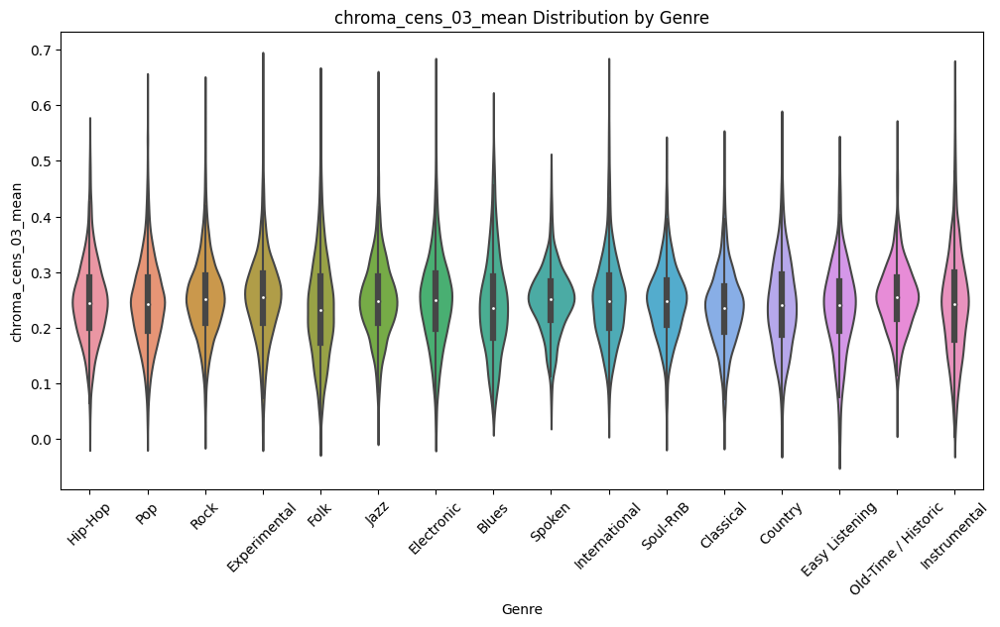

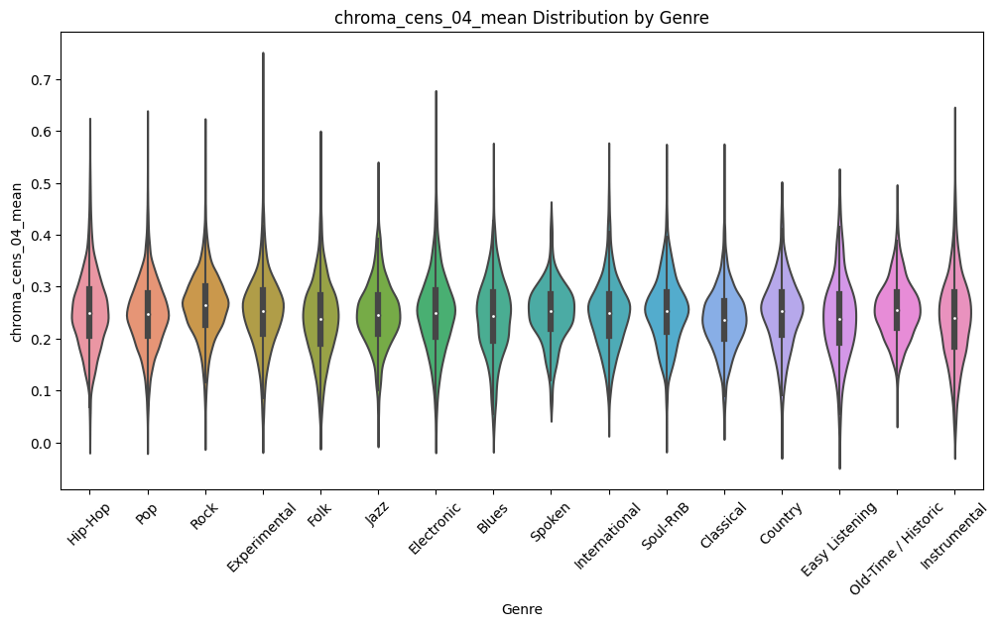

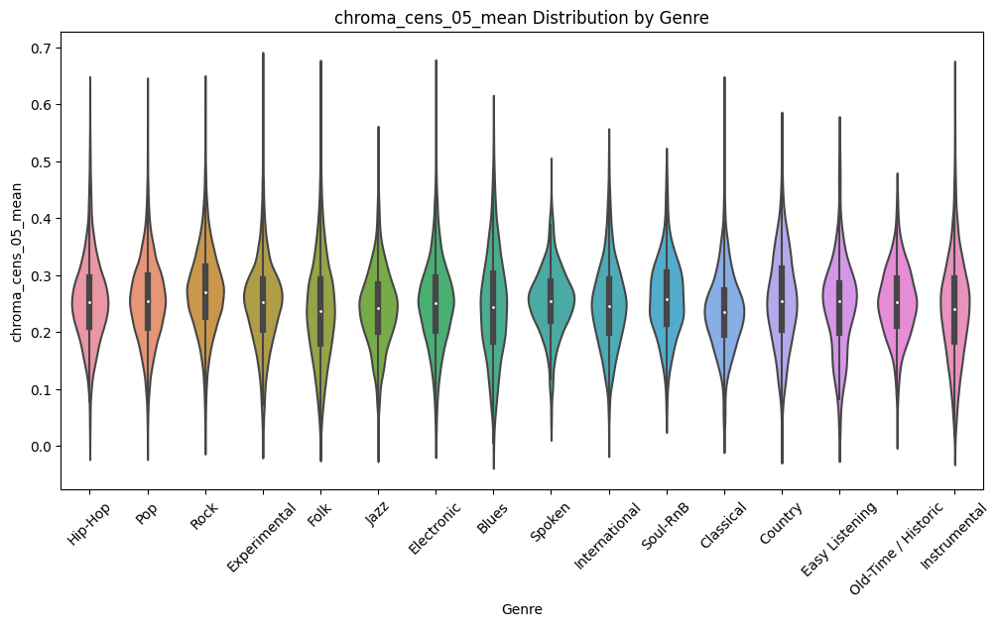

In [43]:
for feature in selected_features[:-1]:
    plt.figure(figsize=(12, 6))
    sns.violinplot(x='genre_top', y=feature, data=data)
    plt.title(f'{feature} Distribution by Genre')
    plt.xlabel('Genre')
    plt.ylabel(feature)
    plt.xticks(rotation=45)
    plt.show()

* Rock, Pop, Folk, and Electronic: These genres appear to have a similar distribution, with medians around 0.2 and relatively symmetrical violin shapes, indicating similar central tendencies and dispersion of the feature.
* Blues, Classical, Country, and Easy Listening: These genres show a wider range of medians, with medians spread from slightly below 0.1 to above 0.4. The violin shapes for Blues and Classical appear somewhat asymmetrical, suggesting a possible skew in the feature's distribution for these genres.

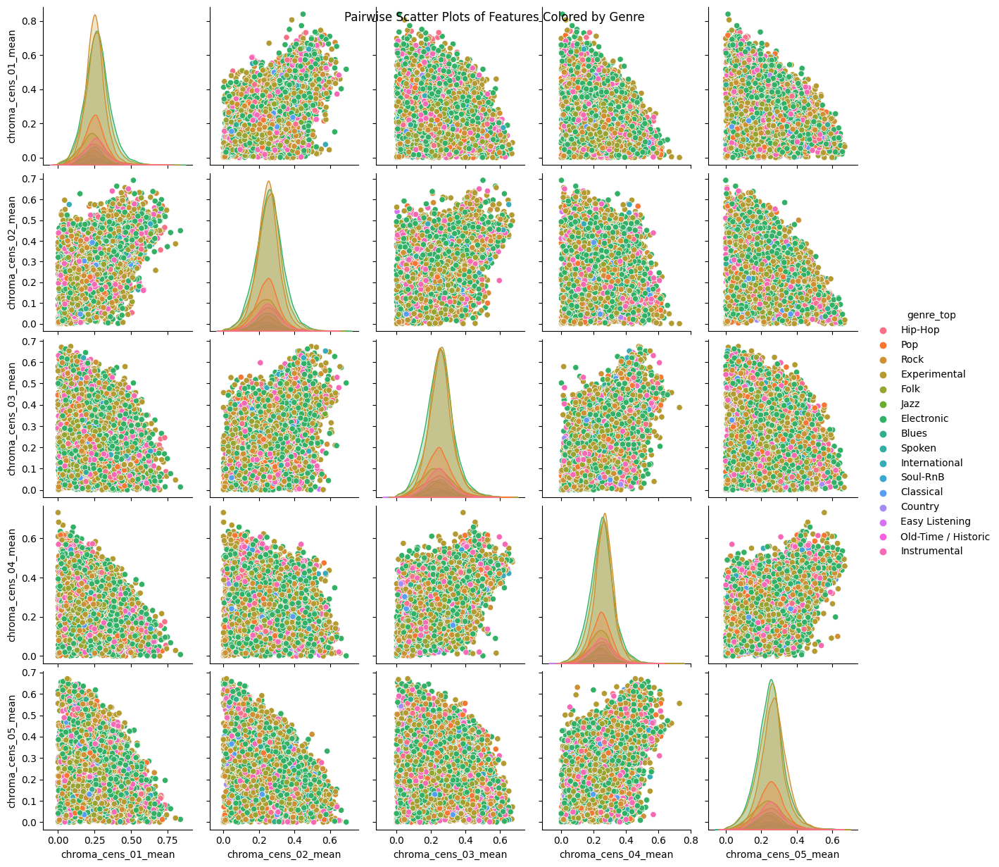

In [44]:
sns.pairplot(data.dropna(), hue='genre_top', diag_kind='kde', vars=selected_features[:-1])
plt.suptitle('Pairwise Scatter Plots of Features Colored by Genre')
plt.show()

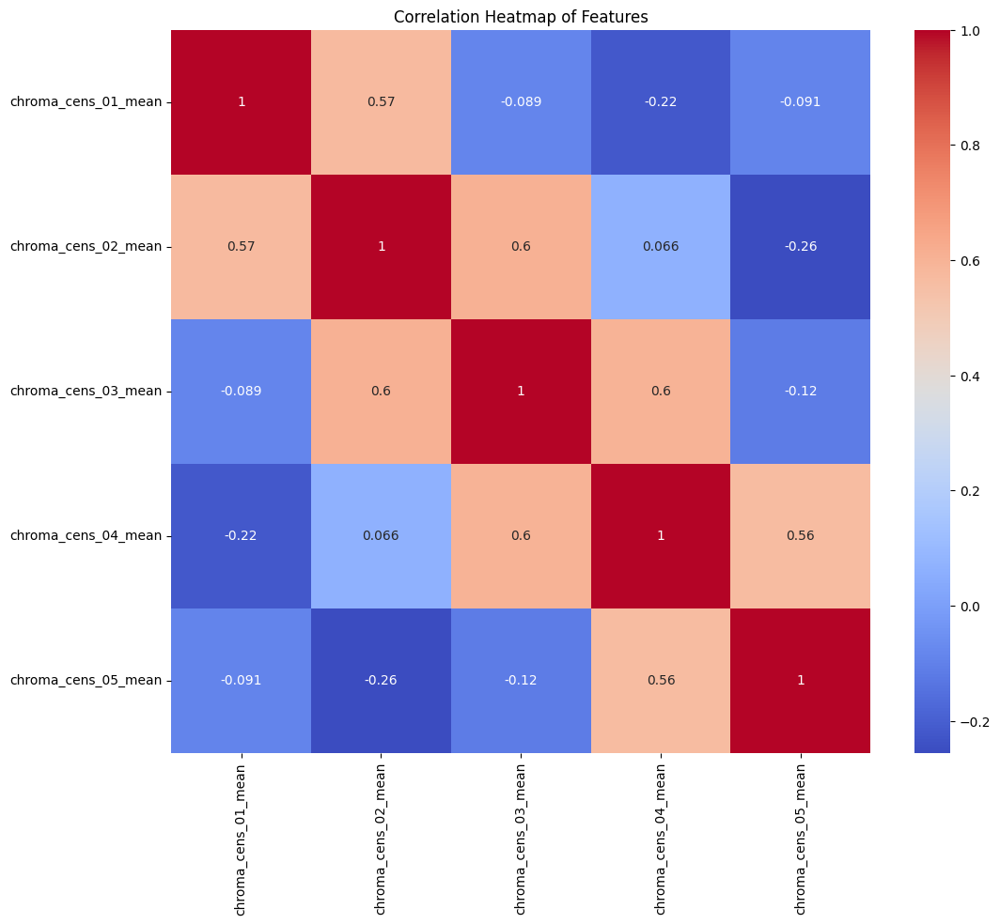

In [45]:
plt.figure(figsize=(12, 10))
sns.heatmap(data[selected_features[:-1]].corr(), cmap='coolwarm', annot=True)
plt.title('Correlation Heatmap of Features')
plt.show()

Chroma features, including Chroma CENS (Chroma Energy Normalized Statistics), represent the distribution of energy in different pitch classes (or musical notes) within a piece of audio. Chroma CENS features are particularly useful for capturing tonal characteristics and harmonic content in music.

When considering how Chroma CENS values are related to each other, it's essential to understand that each Chroma CENS feature corresponds to a specific pitch class.
chroma_cens_01 is for C pitch and chroma_cens_02 is for C# similary all others are related there is a higher correlation between consecutive CENS

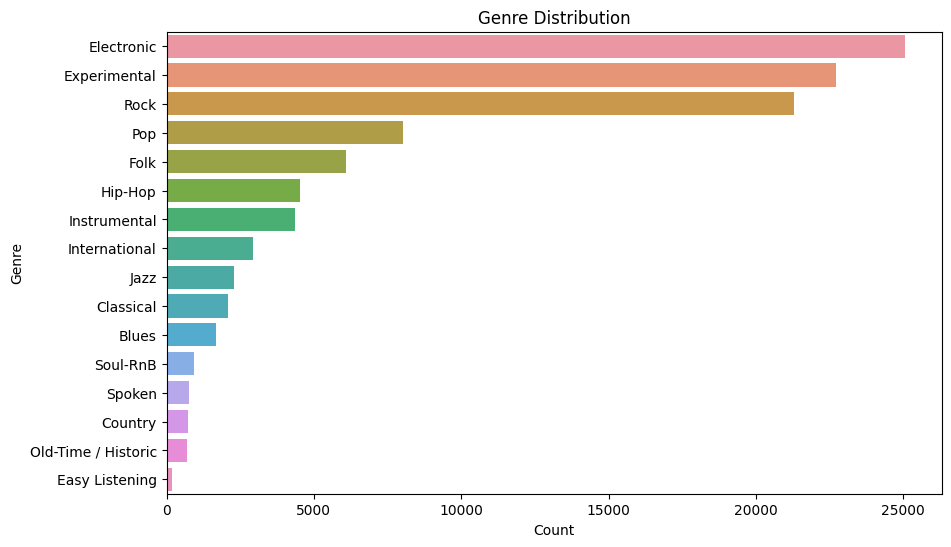

In [46]:
plt.figure(figsize=(10, 6))
sns.countplot(y='genre_top', data=data, order=data['genre_top'].value_counts().index)
plt.title('Genre Distribution')
plt.xlabel('Count')
plt.ylabel('Genre')
plt.show()

In [47]:

chroma_features = {
    'chroma_stft_01_mean',
 'chroma_stft_02_mean',
 'chroma_stft_03_mean',
 'chroma_stft_04_mean',
 'chroma_stft_05_mean',
 'chroma_stft_06_mean',
 'chroma_stft_07_mean',
 'chroma_stft_08_mean',
 'chroma_stft_09_mean',
 'chroma_stft_10_mean',
 'chroma_stft_11_mean',
 'chroma_stft_12_mean',
}

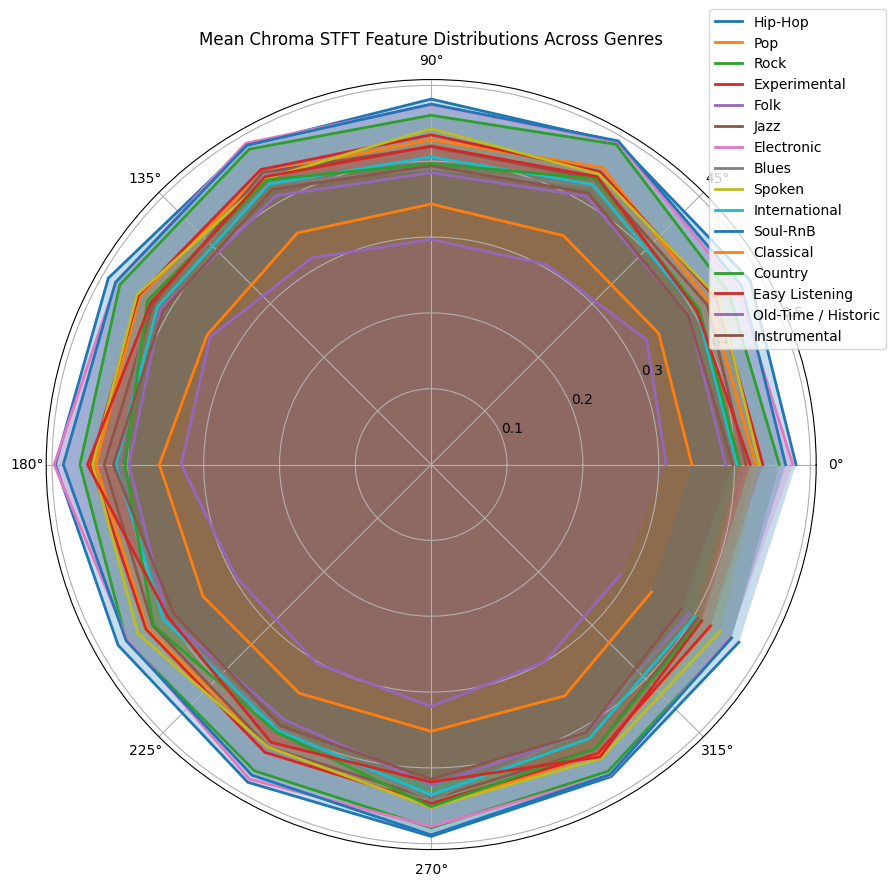

In [48]:
genres = data['genre_top'].unique()
num_features = len(chroma_features)
angles = np.linspace(0, 2 * np.pi, num_features, endpoint=False).tolist()

fig, ax = plt.subplots(figsize=(10, 10), subplot_kw=dict(polar=True))
for genre in genres:
    genre_data = data[data['genre_top'] == genre]
    values = genre_data[list(chroma_features)].mean().values.tolist()
    ax.plot(angles, values, linewidth=2, linestyle='solid', label=genre)
    ax.fill(angles, values, alpha=0.25)
    plt.legend(loc='upper right', bbox_to_anchor=(1.1, 1.1))
    plt.title('Mean Chroma STFT Feature Distributions Across Genres')
plt.show()

STFT is lowest for Old time music and highest for hip-hop (hip hop music often includes strong basslines, drum patterns, and vocal elements. On the other hand, old-time music has different instrumentation and stylistic elements .)
Hip-hop and electronic have similar mean STFT patterns

# Feature Engineering

In [49]:
selected_columns = [col for col in data.columns if ('stft' in col) or ('cqt' in col) or ('cens' in col)]


In [50]:
selected_columns.append('genre_top')

In [51]:
data_selected = data[selected_columns]

# Label Encoding

Only one categorical column: genre_top

In [52]:
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
data_selected['genre_top_encoded'] = label_encoder.fit_transform(data_selected['genre_top'])

In [54]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler

Since chromagram obtained from STFT, CQT, CENS have similar characteristic, I have decided to choose only one of them: 'CQT'

Also for spectral features, I have removed bandwidth and rolloff because centroids, bandwidth, and rolloff features are very highly correlated.

In [55]:
columns_cens = [col for col in data.columns if 'cens' in col]
columns_cstft = [col for col in data.columns if 'stft' in col]
columns_sband = [col for col in data.columns if 'bandwidth' in col]
columns_srolloff = [col for col in data.columns if 'rolloff' in col]

In [56]:
data_ = data.drop(columns=columns_cens+columns_cstft+columns_sband+columns_srolloff)

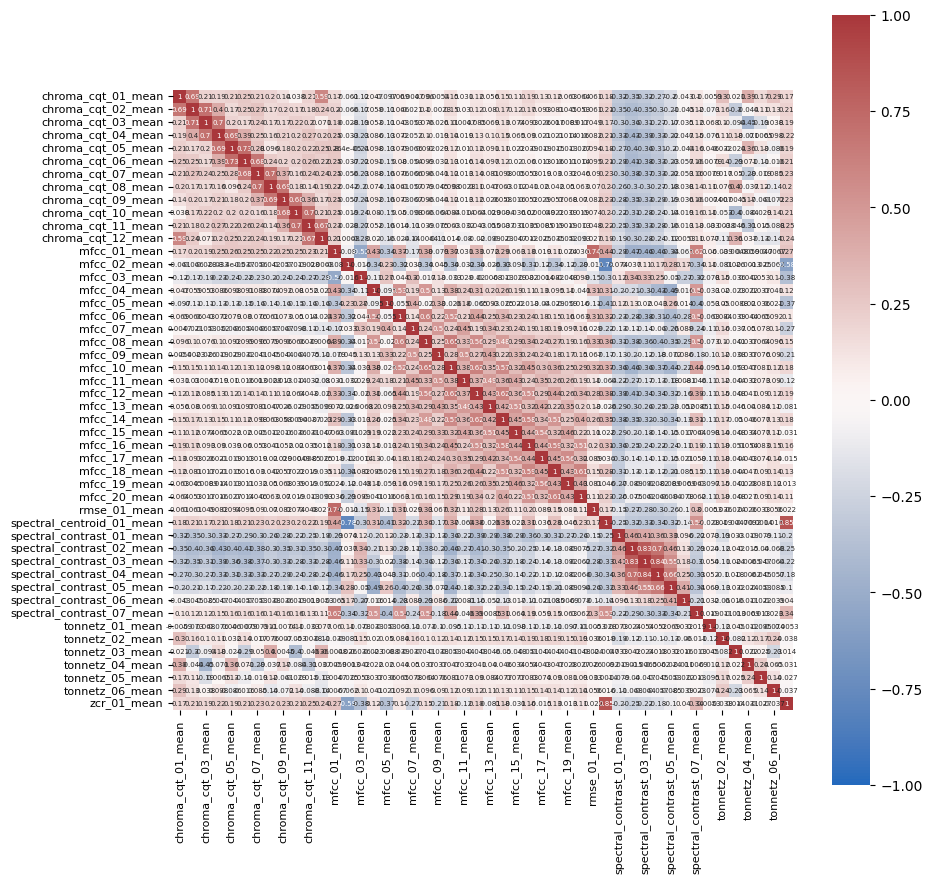

In [57]:
df_ft_mean = data_[[col for col in data_.columns if 'mean' in col]]
plt.figure(figsize=(10,10))
sns.heatmap(df_ft_mean.corr(), cmap='vlag', vmin=-1, vmax=1,center=0, square=True, annot=True, annot_kws={'fontsize':5})
plt.xticks(fontsize = 8)
plt.yticks(fontsize = 8)
plt.show()

# PCA Analysis
With mean features

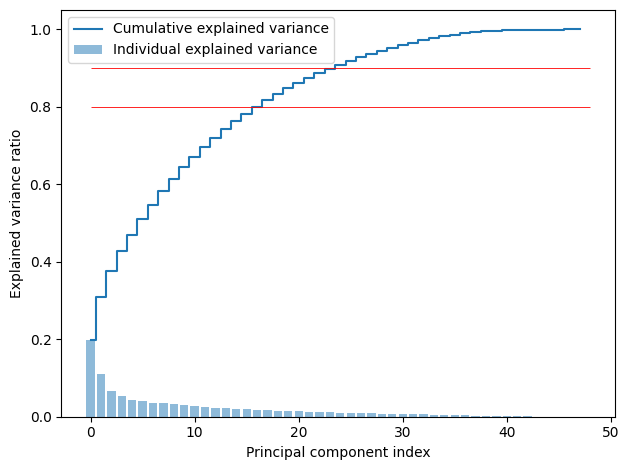

In [58]:
sc = StandardScaler()
df_ft_mean_scaled = sc.fit_transform(df_ft_mean)

pca = PCA()
ft_pca = pca.fit_transform(df_ft_mean_scaled)

exp_var_pca = pca.explained_variance_ratio_
cum_sum_eigenvalues = np.cumsum(exp_var_pca)

plt.bar(range(0,len(exp_var_pca)), exp_var_pca, alpha=0.5, align='center', label='Individual explained variance')
plt.step(range(0,len(cum_sum_eigenvalues)), cum_sum_eigenvalues, where='mid',label='Cumulative explained variance')
plt.hlines(0.8, xmin=0, xmax=len(cum_sum_eigenvalues), color='red', linewidth=.6)
plt.hlines(0.9, xmin=0, xmax=len(cum_sum_eigenvalues), color='red', linewidth=.6)
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal component index')
plt.legend(loc='best')
plt.tight_layout()
plt.show()

* The x-axis of the graph represents the principal component index, which goes from 0 to 50. The y-axis represents the explained variance ratio, which goes from 0 to 1
* Cumulative explained variance: total amount of variance explained by the first n principal components, where n is the principal component index.
*  Individual explained variance: amount of variance explained by each principal component.
*  **At a principal component index of 15, the cumulative explained variance is 0.8. The first 15 principal components explain 80% of the variance in the data. Therefore, 15 components chosen**

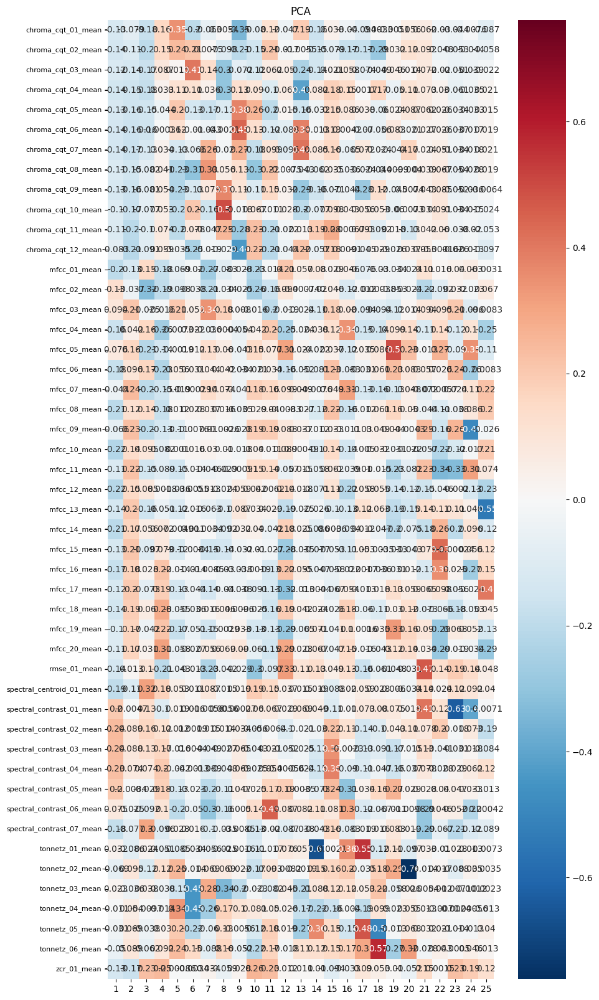

In [59]:
n_comps = 25 
feature_names = df_ft_mean.columns

methods = [
    ("PCA", PCA())]

for (method, fa) in methods:
    fig, ax = plt.subplots(figsize=(10,20))
    fa.set_params(n_components=n_comps)
    fa.fit(df_ft_mean_scaled)

    components = fa.components_.T

    vmax = np.abs(components).max()
    sns.heatmap(components, cmap="RdBu_r", vmax=vmax, vmin=-vmax, ax=ax, annot=True)
    ax.set_yticklabels(labels=feature_names, rotation=0, fontdict={'fontsize':8})
    ax.set_xticklabels(labels= range(1, n_comps+1))
    ax.set_title(str(method))
    plt.show()

**The dataset that initially consisted of 519 columns has been reduced to 15 components using PCA analysis**

In [60]:
# imoprt libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

from glob import glob # allows us to list all files to a directory
import IPython
import IPython.display as ipd # to play the Audio Files

import librosa # main package for working with Audio Data
import librosa.display

In [61]:

df = pd.read_csv("/kaggle/input/gtzan-dataset-music-genre-classification/Data/features_3_sec.csv")

In [62]:
df = df.drop(labels='filename',axis=1)
df.head()

,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,66149,0.335406,0.091048,0.130405,0.003521,1773.065032,167541.630869,1972.744388,117335.771563,3714.560359,...,39.687145,-3.241280,36.488243,0.722209,38.099152,-5.050335,33.618073,-0.243027,43.771767,blues
1,66149,0.343065,0.086147,0.112699,0.001450,1816.693777,90525.690866,2010.051501,65671.875673,3869.682242,...,64.748276,-6.055294,40.677654,0.159015,51.264091,-2.837699,97.030830,5.784063,59.943081,blues
2,66149,0.346815,0.092243,0.132003,0.004620,1788.539719,111407.437613,2084.565132,75124.921716,3997.639160,...,67.336563,-1.768610,28.348579,2.378768,45.717648,-1.938424,53.050835,2.517375,33.105122,blues
3,66149,0.363639,0.086856,0.132565,0.002448,1655.289045,111952.284517,1960.039988,82913.639269,3568.300218,...,47.739452,-3.841155,28.337118,1.218588,34.770935,-3.580352,50.836224,3.630866,32.023678,blues
4,66149,0.335579,0.088129,0.143289,0.001701,1630.656199,79667.267654,1948.503884,60204.020268,3469.992864,...,30.336359,0.664582,45.880913,1.689446,51.363583,-3.392489,26.738789,0.536961,29.146694,blues


In [63]:
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
encoder = LabelEncoder()
scaler = StandardScaler()

In [64]:
data = df.iloc[:, :-1] # get the other columns
data

,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,...,mfcc16_mean,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var
0,66149,0.335406,0.091048,0.130405,0.003521,1773.065032,167541.630869,1972.744388,117335.771563,3714.560359,...,-2.853603,39.687145,-3.241280,36.488243,0.722209,38.099152,-5.050335,33.618073,-0.243027,43.771767
1,66149,0.343065,0.086147,0.112699,0.001450,1816.693777,90525.690866,2010.051501,65671.875673,3869.682242,...,4.074709,64.748276,-6.055294,40.677654,0.159015,51.264091,-2.837699,97.030830,5.784063,59.943081
2,66149,0.346815,0.092243,0.132003,0.004620,1788.539719,111407.437613,2084.565132,75124.921716,3997.639160,...,4.806280,67.336563,-1.768610,28.348579,2.378768,45.717648,-1.938424,53.050835,2.517375,33.105122
3,66149,0.363639,0.086856,0.132565,0.002448,1655.289045,111952.284517,1960.039988,82913.639269,3568.300218,...,-1.359111,47.739452,-3.841155,28.337118,1.218588,34.770935,-3.580352,50.836224,3.630866,32.023678
4,66149,0.335579,0.088129,0.143289,0.001701,1630.656199,79667.267654,1948.503884,60204.020268,3469.992864,...,2.092937,30.336359,0.664582,45.880913,1.689446,51.363583,-3.392489,26.738789,0.536961,29.146694
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9985,66149,0.349126,0.080515,0.050019,0.000097,1499.083005,164266.886443,1718.707215,85931.574523,3015.559458,...,5.773784,42.485981,-9.094270,38.326839,-4.246976,31.049839,-5.625813,48.804092,1.818823,38.966969
9986,66149,0.372564,0.082626,0.057897,0.000088,1847.965128,281054.935973,1906.468492,99727.037054,3746.694524,...,2.074155,32.415203,-12.375726,66.418587,-3.081278,54.414265,-11.960546,63.452255,0.428857,18.697033
9987,66149,0.347481,0.089019,0.052403,0.000701,1346.157659,662956.246325,1561.859087,138762.841945,2442.362154,...,-1.005473,78.228149,-2.524483,21.778994,4.809936,25.980829,1.775686,48.582378,-0.299545,41.586990
9988,66149,0.387527,0.084815,0.066430,0.000320,2084.515327,203891.039161,2018.366254,22860.992562,4313.266226,...,4.123402,28.323744,-5.363541,17.209942,6.462601,21.442928,2.354765,24.843613,0.675824,12.787750


In [65]:
labels = df.iloc[:, -1] # get labels column
labels.to_frame()

,label
0,blues
1,blues
2,blues
3,blues
4,blues
...,...
9985,rock
9986,rock
9987,rock
9988,rock


In [66]:
ft_pca= data

# Splitting Data into train and test

**Splitting the components derived from PCA Analysis (15 components) performed during preprocessing into training and testing**

In [67]:
x = np.array(ft_pca, dtype = float)
x = scaler.fit_transform(ft_pca)
y = encoder.fit_transform(labels)


Splitting into training and testing with a 67-33 split 

In [68]:

from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.33)


## Modeling

We will be comparing various models: 
 1. Gaussian Naive Bayes
 2. Bernoulli Naive Bayes
 3. K-nearest neighbours
 4. Decision Tree
 5. Logistic Regression
 6. XG Boost

In [12]:
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import BernoulliNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report,precision_score,recall_score,f1_score

results = {}

**1. Gaussian Naive Bayes**

In [19]:
gnb = GaussianNB()

gnb.fit(X_train, y_train)

y_pred_gnb = gnb.predict(X_test)

NameError: name 'X_test' is not defined

In [20]:
accuracy_gnb = accuracy_score(y_test, y_pred_gnb)
precision_gnb = precision_score(y_test, y_pred_gnb, average='weighted')
recall_gnb = recall_score(y_test, y_pred_gnb, average='weighted')
f1_gnb = f1_score(y_test, y_pred_gnb, average='weighted')
confusion_mat_gnb = confusion_matrix(y_test, y_pred_gnb)
classification_rep_gnb = classification_report(y_test, y_pred_gnb)

NameError: name 'y_pred_gnb' is not defined

In [21]:
results["Gaussian Naive Bayes"] = {
    "accuracy": accuracy_gnb,
    "precision": precision_gnb,
    "recall": recall_gnb,
    "f1_score": f1_gnb,
    "confusion_matrix": confusion_mat_gnb,
    "classification_report": classification_rep_gnb
}
results["Gaussian Naive Bayes"]["accuracy"]

NameError: name 'accuracy_gnb' is not defined

**Gaussian Naive Bayes gave an accuracy of 52.3%**

In [ ]:
plt.figure(figsize=(8, 6))
sns.heatmap(confusion_mat_gnb, annot=True, fmt="d", cmap="Blues")
plt.title('Confusion Matrix - Gaussian Naive Bayes')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.show()

**2. Bernoulli Naive Bayes**

In [ ]:
bnb = BernoulliNB()

bnb.fit(X_train, y_train)

y_pred_bnb = bnb.predict(X_test)

In [ ]:
accuracy_bnb = accuracy_score(y_test, y_pred_bnb)
precision_bnb = precision_score(y_test, y_pred_bnb, average='weighted')
recall_bnb = recall_score(y_test, y_pred_bnb, average='weighted')
f1_bnb = f1_score(y_test, y_pred_bnb, average='weighted')
confusion_mat_bnb = confusion_matrix(y_test, y_pred_bnb)
classification_rep_bnb = classification_report(y_test, y_pred_bnb)

In [ ]:
results["Bernoulli Naive Bayes"] = {
    "accuracy": accuracy_bnb,
    "precision": precision_bnb,
    "recall": recall_bnb,
    "f1_score": f1_bnb,
    "confusion_matrix": confusion_mat_bnb,
    "classification_report": classification_rep_bnb
}
results["Bernoulli Naive Bayes"]["accuracy"]

**Bernoulli Naive Bayes gave an accuracy of 47.65%**

In [ ]:
plt.figure(figsize=(8, 6))
sns.heatmap(confusion_mat_bnb, annot=True, fmt="d", cmap="Blues")
plt.title('Confusion Matrix - Bernoulli Naive Bayes')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.show()

**3. K-Nearest Neighbours**

In [ ]:
knn = KNeighborsClassifier()

knn.fit(X_train, y_train)

y_pred_knn = knn.predict(X_test)

In [ ]:
accuracy_knn = accuracy_score(y_test, y_pred_knn)
precision_knn = precision_score(y_test, y_pred_knn, average='weighted')
recall_knn = recall_score(y_test, y_pred_knn, average='weighted')
f1_knn = f1_score(y_test, y_pred_knn, average='weighted')
confusion_mat_knn = confusion_matrix(y_test, y_pred_knn)
classification_rep_knn = classification_report(y_test, y_pred_knn)

In [ ]:
results["K-Nearest Neighbors"] = {
    "accuracy": accuracy_knn,
    "precision": precision_knn,
    "recall": recall_knn,
    "f1_score": f1_knn,
    "confusion_matrix": confusion_mat_knn,
    "classification_report": classification_rep_knn
}
results["K-Nearest Neighbors"]["accuracy"]

**K-Nearest Neighbours gave an accuracy of 90.24%**

In [ ]:
import seaborn as sns

plt.figure(figsize=(8, 6))
sns.heatmap(confusion_mat_knn, annot=True, fmt="d", cmap="Blues")
plt.title('Confusion Matrix - K-Nearest Neighbors')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.show()

**4. Decision Tree**

In [ ]:
dt = DecisionTreeClassifier()

dt.fit(X_train, y_train)

y_pred_dt = dt.predict(X_test)

In [ ]:
accuracy_dt = accuracy_score(y_test, y_pred_dt)
precision_dt = precision_score(y_test, y_pred_dt, average='weighted')
recall_dt = recall_score(y_test, y_pred_dt, average='weighted')
f1_dt = f1_score(y_test, y_pred_dt, average='weighted')
confusion_mat_dt = confusion_matrix(y_test, y_pred_dt)
classification_rep_dt = classification_report(y_test, y_pred_dt)

In [ ]:
results["Decision Tree"] = {
    "accuracy": accuracy_dt,
    "precision": precision_dt,
    "recall": recall_dt,
    "f1_score": f1_dt,
    "confusion_matrix": confusion_mat_dt,
    "classification_report": classification_rep_dt
}
results["Decision Tree"]["accuracy"]

**Decision Tree classifier gave an accuracy of 65.31%**

In [ ]:
plt.figure(figsize=(8, 6))
sns.heatmap(confusion_mat_dt, annot=True, fmt="d", cmap="Blues")
plt.title('Confusion Matrix - Decision Tree')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.show()

**5. Logistic Regression**

In [ ]:
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression(max_iter=1000)

lr.fit(X_train, y_train)

y_pred_lr = lr.predict(X_test)

In [ ]:
accuracy_lr = accuracy_score(y_test, y_pred_lr)
precision_lr = precision_score(y_test, y_pred_lr, average='weighted')
recall_lr = recall_score(y_test, y_pred_lr, average='weighted')
f1_lr = f1_score(y_test, y_pred_lr, average='weighted')
confusion_mat_lr = confusion_matrix(y_test, y_pred_lr)
classification_rep_lr = classification_report(y_test, y_pred_lr)

In [ ]:
results["Logistic Regression"] = {
    "accuracy": accuracy_lr,
    "precision": precision_lr,
    "recall": recall_lr,
    "f1_score": f1_lr,
    "confusion_matrix": confusion_mat_lr,
    "classification_report": classification_rep_lr
}
results["Logistic Regression"]["accuracy"]

**Logistic Regression gave an accuracy of 73.62%**

In [ ]:
plt.figure(figsize=(8, 6))
sns.heatmap(confusion_mat_lr, annot=True, fmt="d", cmap="Blues")
plt.title('Confusion Matrix - Logistic Regression')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.show()

**6. XG Boost**

In [ ]:
xgb_model = XGBClassifier()

xgb_model.fit(X_train, y_train)

y_pred_xgb = xgb_model.predict(X_test)

In [ ]:
accuracy_xgb = accuracy_score(y_test, y_pred_xgb)
precision_xgb = precision_score(y_test, y_pred_xgb, average='weighted')
recall_xgb = recall_score(y_test, y_pred_xgb, average='weighted')
f1_xgb = f1_score(y_test, y_pred_xgb, average='weighted')
confusion_mat_xgb = confusion_matrix(y_test, y_pred_xgb)
classification_rep_xgb = classification_report(y_test, y_pred_xgb)

In [ ]:
results["XGBoost"] = {
    "accuracy": accuracy_xgb,
    "precision": precision_xgb,
    "recall": recall_xgb,
    "f1_score": f1_xgb,
    "confusion_matrix": confusion_mat_xgb,
    "classification_report": classification_rep_xgb
}
results["XGBoost"]["accuracy"]

**XG Boost resulted in an accuracy of 91.89%**

In [ ]:
plt.figure(figsize=(8, 6))
sns.heatmap(confusion_mat_xgb, annot=True, fmt="d", cmap="Blues")
plt.title('Confusion Matrix - XGBoost')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.show()

In [ ]:
import matplotlib.pyplot as plt
names = list(results.keys())
accuracies = [results[name]["accuracy"] for name in names]
precisions = [results[name]["precision"] for name in names]
recalls = [results[name]["recall"] for name in names]
f1_scores = [results[name]["f1_score"] for name in names]

In [ ]:
plt.figure(figsize=(12, 8))
plt.subplot(2, 2, 1)
plt.barh(names, accuracies, color='skyblue')
plt.xlabel('Accuracy')
plt.title('Classifier Accuracy Comparison')
plt.xlim(0.0, 1.0)
plt.gca().invert_yaxis()  


plt.subplot(2, 2, 2)
plt.barh(names, precisions, color='salmon')
plt.xlabel('Precision')
plt.title('Classifier Precision Comparison')
plt.xlim(0.0, 1.0)
plt.gca().invert_yaxis()  


plt.subplot(2, 2, 3)
plt.barh(names, recalls, color='lightgreen')
plt.xlabel('Recall')
plt.title('Classifier Recall Comparison')
plt.xlim(0.0, 1.0)
plt.gca().invert_yaxis()  


plt.subplot(2, 2, 4)
plt.barh(names, f1_scores, color='lightcoral')
plt.xlabel('F1-score')
plt.title('Classifier F1-score Comparison')
plt.xlim(0.0, 1.0)
plt.gca().invert_yaxis()  

plt.tight_layout()
plt.show()

From above we can conclude **XG Boost** gives the best result with an accuracy of **91.89%**

# Hyperparameter Tuning

In [69]:
import numpy as np
from sklearn.model_selection import GridSearchCV, train_test_split
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score

In [70]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)
param_grid = {
    'learning_rate': [0.01, 0.1, 0.3],
    'max_depth': [3, 5, 7],
    'min_child_weight': [1, 3, 5],
    'subsample': [0.5, 0.7, 0.9],
    'colsample_bytree': [0.5, 0.7, 0.9]
}


In [71]:
xgb_model = XGBClassifier()
grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid, cv=3, n_jobs=-1, verbose=2)

In [ ]:
grid_search.fit(X_train, y_train)
print("Best parameters found:")
print(grid_search.best_params_)


best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)

Fitting 3 folds for each of 243 candidates, totalling 729 fits


In [ ]:
print("Accuracy on test set:", accuracy)

* Best parameters found: {'colsample_bytree': 0.5, 'learning_rate': 0.3, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.9}
* Accuracy on test set: 0.9114114114114115

In [ ]:
best_xgb_model = XGBClassifier(
    colsample_bytree=0.5,
    learning_rate=0.3,
    max_depth=7,
    min_child_weight=1,
    subsample=0.9
)

best_xgb_model.fit(data, y)

y_pred = best_xgb_model.predict(data)

accuracy = accuracy_score(y, y_pred)
print("Accuracy on entire dataset:", accuracy)

precision = precision_score(y, y_pred, average='weighted')
recall = recall_score(y, y_pred, average='weighted')
f1 = f1_score(y, y_pred, average='weighted')
confusion_mat = confusion_matrix(y, y_pred)
classification_rep = classification_report(y, y_pred)

**XG Boost with selected parameter gives an accuracy of 99.89%**